In [5]:
import numpy as np
# from rtc_seq_dataset import SeqDistDataset, open_rtc_table
from torch.utils.data import DataLoader
from tqdm import tqdm
import torch
import pandas as pd
import geopandas as gpd

# Data Stuff

In [16]:
df_burst = gpd.read_parquet('validation_bursts_v1_coverage_updated.parquet')
df_burst = df_burst.drop_duplicates(subset='jpl_burst_id').reset_index(drop=True)
df_burst.shape

(105, 4)

In [17]:
df_burst.head()

,jpl_burst_id,geometry,n_acquisitions,site_id
0,T005-008692-IW2,"POLYGON ((-97.21446 17.86505, -97.21446 17.864...",104,72
1,T008-015865-IW2,"POLYGON ((-1.50129 41.44183, -1.5013 41.44156,...",101,150
2,T012-024584-IW1,"POLYGON ((-103.78409 20.20832, -103.78409 20.2...",101,34
3,T014-028130-IW2,"POLYGON ((37.01648 35.59545, 37.01649 35.59518...",100,22
4,T014-028131-IW2,"POLYGON ((36.98085 35.76145, 36.98085 35.76118...",38,22


In [128]:
START_INDEX = 0
TOTAL_BURSTS = 105

In [129]:
df_burst_subset = df_burst.iloc[START_INDEX:START_INDEX + TOTAL_BURSTS].reset_index(drop=True)
df_burst_subset.head()

,jpl_burst_id,geometry,n_acquisitions,site_id
0,T005-008692-IW2,"POLYGON ((-97.21446 17.86505, -97.21446 17.864...",104,72
1,T008-015865-IW2,"POLYGON ((-1.50129 41.44183, -1.5013 41.44156,...",101,150
2,T012-024584-IW1,"POLYGON ((-103.78409 20.20832, -103.78409 20.2...",101,34
3,T014-028130-IW2,"POLYGON ((37.01648 35.59545, 37.01649 35.59518...",100,22
4,T014-028131-IW2,"POLYGON ((36.98085 35.76145, 36.98085 35.76118...",38,22


In [130]:
df_burst_subset.shape

(105, 4)

In [131]:
total_files = df_burst_subset.n_acquisitions.sum()
f'Approx files will be {total_files * 30 / 1e3} GB (total_files: {total_files})'

'Approx files will be 294.45 GB (total_files: 9815)'

In [132]:
df_rtc = pd.read_json('rtc_s1_table.json.zip')
df_rtc.head()

,rtc_s1_id,input_slc_id,jpl_burst_id,bursts_per_slc_input,rtc_s1_vv_url,rtc_s1_vh_url,rtc_s1_h5_url,acq_datetime
0,OPERA_L2_RTC-S1_T005-008688-IW2_20201010T00400...,S1A_IW_SLC__1SDV_20201010T004001_20201010T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-10 00:40:01
1,OPERA_L2_RTC-S1_T005-008688-IW2_20201022T00400...,S1A_IW_SLC__1SDV_20201022T004000_20201022T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-22 00:40:00
2,OPERA_L2_RTC-S1_T005-008688-IW2_20201103T00400...,S1A_IW_SLC__1SDV_20201103T004000_20201103T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-11-03 00:40:00
3,OPERA_L2_RTC-S1_T005-008688-IW2_20201115T00400...,S1A_IW_SLC__1SDV_20201115T004000_20201115T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-11-15 00:40:00
4,OPERA_L2_RTC-S1_T005-008688-IW2_20201127T00400...,S1A_IW_SLC__1SDV_20201127T004000_20201127T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-11-27 00:40:00


In [133]:
df_rtc_subset = pd.merge(df_rtc, df_burst_subset[['jpl_burst_id']], how='inner', on='jpl_burst_id').reset_index(drop=True)
df_rtc_subset.sort_values(by=['jpl_burst_id', 'rtc_s1_id'], inplace=True, ascending=True)
df_rtc_subset.head()

,rtc_s1_id,input_slc_id,jpl_burst_id,bursts_per_slc_input,rtc_s1_vv_url,rtc_s1_vh_url,rtc_s1_h5_url,acq_datetime
0,OPERA_L2_RTC-S1_T005-008692-IW2_20201004T00392...,S1B_IW_SLC__1SDV_20201004T003926_20201004T0039...,T005-008692-IW2,28,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-04 00:39:26
1,OPERA_L2_RTC-S1_T005-008692-IW2_20201010T00401...,S1A_IW_SLC__1SDV_20201010T004001_20201010T0040...,T005-008692-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-10 00:40:01
2,OPERA_L2_RTC-S1_T005-008692-IW2_20201016T00393...,S1B_IW_SLC__1SDV_20201016T003926_20201016T0039...,T005-008692-IW2,28,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-16 00:39:26
3,OPERA_L2_RTC-S1_T005-008692-IW2_20201022T00401...,S1A_IW_SLC__1SDV_20201022T004000_20201022T0040...,T005-008692-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-22 00:40:00
4,OPERA_L2_RTC-S1_T005-008692-IW2_20201028T00393...,S1B_IW_SLC__1SDV_20201028T003926_20201028T0039...,T005-008692-IW2,28,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-28 00:39:26


In [134]:
df_rtc_subset.shape

(9815, 8)

In [135]:
df_rtc_subset.to_parquet('rtc_data_subset.parquet')

In [2]:
num_pre_imgs = 10

In [3]:
from rtc_seq_dataset_stream import SeqDistDatasetStreamPatches, open_rtc_table

df_rtc = open_rtc_table()

Not sure if we should use this:

In [138]:
%reload_ext autoreload

In [4]:
seq_dataset = SeqDistDatasetStreamPatches(
                             n_pre_imgs=num_pre_imgs,
                             df_rtc_meta=df_rtc,
                             root=f'test_data/')

print(" ")
print(" ")
print(f"Loaded with {num_pre_imgs} pre-images from {len(seq_dataset)} bursts")
# print(len(seq_dataset)) # this is number of bursts used

localize patch tables: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 105/105 [00:02<00:00, 47.65it/s]

 
 
Loaded with 10 pre-images from 105 bursts


In [6]:
# import os

# subfolders = [f.name for f in os.scandir("test_data") if f.is_dir()]
    
# # Check if subfolder names are unique
# if len(subfolders) == len(set(subfolders)):
#     print("All subfolders have unique names.")
# else:
#     print("There are duplicate subfolder names.")

# # Print the number of subfolders
# print(f"Number of subfolders: {len(subfolders)}")

# # compare this to what we had in the summer

All subfolders have unique names.
Number of subfolders: 128


Or this:

In [225]:

import rtc_seq_dataset

importlib.reload(rtc_seq_dataset)

<module 'rtc_seq_dataset' from '/mnt/aurora-r0/hardiman/rtc_seq_dataset.py'>

In [226]:
%reload_ext autoreload

In [2]:
from rtc_seq_dataset import SeqDistDataset, open_rtc_table

In [3]:
seq_dataset = SeqDistDataset(n_pre_imgs=10,
                             root='test_data/',
                             n_workers_for_download = 4,
                             patch_size= 224,
                             rtc_s1_parquet_table_path='rtc_data_subset.parquet', #have to update this for given burst range
                            )

localize patch tables: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 105/105 [00:00<00:00, 65448.35it/s]


Test

In [4]:
len(seq_dataset)

1281287

599530


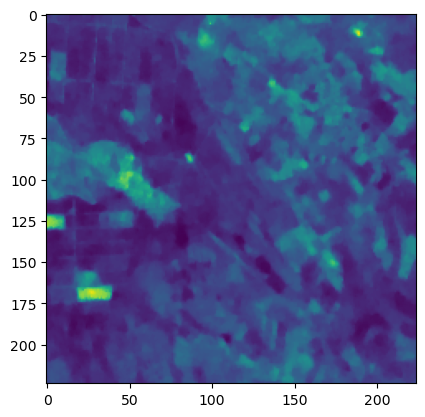

In [230]:
import matplotlib.pyplot as plt
index = np.random.randint(len(seq_dataset))
print(index)

plt.imshow(seq_dataset[index]["post_img"][0,:,:])
# plt.imshow(seq_dataset[index]["post_img"][1,:,:])

In [206]:
dataloader = DataLoader(seq_dataset, batch_size=32, shuffle=True)
print(len(dataloader))

40041


### Various storage experiments

In [ ]:
%%time

for i, data in enumerate(dataloader):
    train_data = data["pre_imgs"]
    target = data["post_img"]
    print(train_data.shape)
    print(target.shape)
    break

In [32]:
dataset_of_128 = torch.utils.data.TensorDataset(train_data,target)

In [33]:
torch.save(dataset_of_128, "PytorchData/how_much_space_is_this_128.pt")

In [83]:
train_np = train_data.numpy()
target_np = target.numpy()

In [84]:
np.savez_compressed('PytorchData/how_much_space_128.npz', pre_imgs=train_np, post_img=target_np)

In [87]:
import h5py
import torch

# Saving data with compression
with h5py.File('PytorchData/how_much_space_128.h5', 'w') as f:
    # Save pre-images and post-image tensors with compression
    f.create_dataset('pre_imgs', data=train_np, compression="gzip")
    f.create_dataset('post_img', data=target_np, compression="gzip")

# # Loading data from HDF5
# with h5py.File('data.h5', 'r') as f:
#     pre_imgs = torch.tensor(f['pre_imgs'][:])
#     post_img = torch.tensor(f['post_img'][:])

In [88]:
import zarr

z = zarr.open('data.zarr', mode='w')
z.create_dataset('pre_imgs', data=train_np, compressor=zarr.Blosc(cname='zstd', clevel=4, shuffle=2))

<zarr.core.Array '/pre_imgs' (128, 10, 2, 224, 224) float32>

In [215]:
%%time

hmm = torch.load("PytorchData/how_much_space_is_this_128.pt")

<timed exec>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


CPU times: user 1.54 ms, sys: 285 ms, total: 287 ms
Wall time: 285 ms


128


# Transformer

In [1]:
import numpy as np
from torch.utils.data import DataLoader, random_split, RandomSampler, SequentialSampler
import matplotlib.pyplot as plt
import torch
from tqdm import tqdm
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import DataLoader, Subset, ConcatDataset
import time
import random
from IPython.display import HTML
from utils import log_ratio, visualize_reconstruction, animate_data, nll_gaussian, nll_gaussian_stable
import einops
import importlib

### New stuff

In [29]:
class SpatioTemporalTransformer(nn.Module):
    def __init__(self, model_config):
        super(SpatioTemporalTransformer, self).__init__()

        # self.data_dim = model_config['data_dim'] # dim of patches
        self.d_model = model_config['d_model']
        self.nhead = model_config['nhead']
        self.num_encoder_layers = model_config['num_encoder_layers']
        self.dim_feedforward = model_config['dim_feedforward']
        self.max_seq_len = model_config['max_seq_len']
        self.dropout = model_config['dropout']
        self.activation = model_config['activation']

        self.num_patches = model_config['num_patches']
        self.patch_size = model_config['patch_size']
        self.data_dim = model_config['data_dim']

        self.embedding = nn.Linear(self.data_dim, self.d_model)

        self.spatial_pos_embed = nn.Parameter(torch.zeros(1, 1, self.num_patches, self.d_model))
        self.temporal_pos_embed = nn.Parameter(torch.zeros(1, self.max_seq_len, 1, self.d_model))

        #we use 'encoder' for simplicity - but equivalent to the "Decoder only" framework
        encoder_layer = nn.TransformerEncoderLayer(
            self.d_model, self.nhead, self.dim_feedforward, dropout=self.dropout, activation=self.activation, batch_first=True
            )

        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, self.num_encoder_layers)

        self.mean_out = nn.Sequential(
            nn.Linear(self.d_model, self.dim_feedforward), #reuse dim feedforward here
            nn.ReLU(),
            nn.Linear(self.dim_feedforward, self.data_dim)
        )

        self.logvar_out = nn.Sequential(
            nn.Linear(self.d_model, self.dim_feedforward), #reuse dim feedforward here
            nn.ReLU(),
            nn.Linear(self.dim_feedforward, self.data_dim)
        )

    def num_parameters(self):
        """Count the number of trainable parameters in the model."""
        if not hasattr(self, '_num_parameters'):
            self._num_parameters = 0
            for p in self.parameters():
                count = 1
                for s in p.size():
                    count *= s
                self._num_parameters += count

        return self._num_parameters

    def forward(self, src):

        batch_size, seq_len, channels, height, width = src.shape

        assert num_patches == (height*width) / (self.patch_size**2)
        assert seq_len <= self.max_seq_len

        src = einops.rearrange(src, 'b t c (h ph) (w pw) -> b t (h w) (c ph pw)', ph=self.patch_size, pw=self.patch_size) # batch, seq_len, num_patches, data_dim

        # after this line, the shape will be batch, seq_len, num_patches, d_model
        # the indexing on temporal_pos_embed is in case the input is less than max_seq_len
        src = self.embedding(src) + self.spatial_pos_embed + self.temporal_pos_embed[:, (self.max_seq_len-seq_len):, :, :] 

        src = src.view(batch_size, seq_len * self.num_patches, self.d_model) # transformer expects (batch_size, sequence, dmodel)

        # Pass through the transformer encoder with causal masking
        mask = nn.Transformer.generate_square_subsequent_mask(seq_len).to(src.device)
        # mask = mask.repeat(self.num_patches, self.num_patches)
        mask = mask.repeat_interleave(num_patches, dim=0).repeat_interleave(num_patches, dim=1)

        output = self.transformer_encoder(src, mask=mask)

        mean = self.mean_out(output) # batchsize, seq_len*num_patches, data_dim
        logvar = self.logvar_out(output) # batchsize, seq_len*num_patches, data_dim

        mean = mean.view(batch_size, seq_len, self.num_patches, self.data_dim) #undo previous operation
        logvar = logvar.view(batch_size, seq_len, self.num_patches, self.data_dim)

        # reshape to be the same shape as input batch_size, seq len, channels, height, width
        mean = einops.rearrange(mean, 'b t (h w) (c ph pw) -> b t c (h ph) (w pw)',
                                ph=self.patch_size, pw=self.patch_size,c=channels, h=height//patch_size, w=width//patch_size)

        logvar = einops.rearrange(logvar, 'b t (h w) (c ph pw) -> b t c (h ph) (w pw)',
                                ph=self.patch_size, pw=self.patch_size,c=channels, h=height//patch_size, w=width//patch_size)

        return mean, logvar

In [4]:
# model = SpatioTemporalTransformer(tf_config)
# print("Number of parameters: ", model.num_parameters())

In [30]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [31]:
import time

# this line is slow for some reason and we need it every loss so we construct it once to start
pi = torch.FloatTensor([np.pi]).to(device)

def run_epoch(dataloader, model, optimizer, device, train=True):
    """Perform one epoch of training by looping through the dataset once."""

    '''
    dataloader should have:
    pre_imgs: (batch_size, max_seq_len, channels, height, width)
    target: (batch_size, channels, height, width)
    '''

    # Setting models and datasets into train/test mode
    if train:
        model.train()
    else:
        model.eval()

    nll_total = 0
    mse_total = 0

    naive_nll = 0
    naive_mse = 0

    for batch_idx, (batch,target) in enumerate(dataloader):

        input_size = 16
        
        batch = batch.unfold(3, input_size, input_size).unfold(4, input_size, input_size)
        target = target.unfold(2, input_size, input_size).unfold(3, input_size, input_size)

        batch = batch.permute(0, 3, 4, 1, 2, 5, 6).reshape(-1, 10, 2, input_size, input_size)
        target = target.permute(0, 2, 3, 1, 4, 5).reshape(-1, 2, input_size, input_size)

        target = torch.special.logit(target) #make sure you're doing this once and not 0 or 2 times...
        batch = torch.special.logit(batch)

        ### 
        # mask_out_idx = torch.randint(0,9,(1,))
        # batch = batch[:, mask_out_idx:, ...] 
        ###
        
        target = target.to(device) #might have to change this depending on dataloading approach
        batch = batch.to(device)

        if train:
          
          pred_means, pred_logvars = model(batch)
          
          # dataset was originally set up to take pre_imgs and predict target, now we train autoregressively so every part of
          # the sequence is the target
          actual_target = torch.cat((batch[:,1:,...],target.unsqueeze(dim=1)), 1)

          # new style
          # need to input pi as constructed above because for some reason constructing it each time was slow
          loss = nll_gaussian(pred_means, pred_logvars, actual_target, pi) 
          mse_total += F.mse_loss(pred_means, actual_target).item()

          optimizer.zero_grad()
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), 10) 
          optimizer.step()

        else:
          with torch.no_grad():

            # compute baseline based on pre image mean and var
            pre_image_mean = torch.mean(batch, dim=1)
            pre_image_var = torch.var(batch, dim=1)
            pre_image_var += 1e-8 # for numerical stability

            naive_nll += nll_gaussian_stable(pre_image_mean, pre_image_var, target)
            naive_mse += F.mse_loss(pre_image_mean, target).item()

            # get prediction
            pred_means, pred_logvars = model(batch)

            actual_target = torch.cat((batch[:,1:,...],target.unsqueeze(dim=1)), 1)
            loss = nll_gaussian(pred_means, pred_logvars, actual_target, pi)
              
            mse_total += F.mse_loss(pred_means, actual_target).item()

        nll_total += loss.item()

    nll_average = nll_total / len(dataloader) # average NLL per sequence (sample)
    mse_average = mse_total / len(dataloader)

    naive_nll_average = naive_nll / len(dataloader)
    naive_mse_average = naive_mse / len(dataloader)

    if epoch % 10 == 0:
      print('Train \n' if train else 'Test \n')
      print('NLL: {:.6f}'.format(nll_average))
      if not train:
        print('Naive NLL: {:.6f}\n'.format(naive_nll_average))

      print('MSE: {:.6f}'.format(mse_average))
      if not train:
        print('Naive MSE: {:.6f}'.format(naive_mse_average))
      print(" ")

    return nll_average, mse_average 

### end of summer code

In [2]:
class SpatioTemporalTransformer(nn.Module):
    def __init__(self, model_config):
        super(SpatioTemporalTransformer, self).__init__()

        # self.data_dim = model_config['data_dim'] # dim of patches
        self.d_model = model_config['d_model']
        self.nhead = model_config['nhead']
        self.num_encoder_layers = model_config['num_encoder_layers']
        self.dim_feedforward = model_config['dim_feedforward']
        self.max_seq_len = model_config['max_seq_len']
        self.dropout = model_config['dropout']
        self.activation = model_config['activation']

        self.num_patches = model_config['num_patches']
        self.patch_size = model_config['patch_size']
        self.data_dim = model_config['data_dim']

        self.embedding = nn.Linear(self.data_dim, self.d_model)

        self.spatial_pos_embed = nn.Parameter(torch.zeros(1, 1, self.num_patches, self.d_model))
        self.temporal_pos_embed = nn.Parameter(torch.zeros(1, self.max_seq_len, 1, self.d_model))

        #we use 'encoder' for simplicity - but equivalent to the "Decoder only" framework
        encoder_layer = nn.TransformerEncoderLayer(
            self.d_model, self.nhead, self.dim_feedforward, dropout=self.dropout, activation=self.activation, batch_first=True
            )

        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, self.num_encoder_layers)

        self.mean_out = nn.Sequential(
            nn.Linear(self.d_model, self.dim_feedforward), #reuse dim feedforward here
            nn.ReLU(),
            nn.Linear(self.dim_feedforward, self.data_dim)
        )

        self.logvar_out = nn.Sequential(
            nn.Linear(self.d_model, self.dim_feedforward), #reuse dim feedforward here
            nn.ReLU(),
            nn.Linear(self.dim_feedforward, self.data_dim)
        )

    def num_parameters(self):
        """Count the number of trainable parameters in the model."""
        if not hasattr(self, '_num_parameters'):
            self._num_parameters = 0
            for p in self.parameters():
                count = 1
                for s in p.size():
                    count *= s
                self._num_parameters += count

        return self._num_parameters

    def forward(self, src):

        batch_size, seq_len, channels, height, width = src.shape

        assert num_patches == (height*width) / (self.patch_size**2)

        src = einops.rearrange(src, 'b t c (h ph) (w pw) -> b t (h w) (c ph pw)', ph=self.patch_size, pw=self.patch_size) # batch, seq_len, num_patches, data_dim

        src = self.embedding(src) + self.spatial_pos_embed + self.temporal_pos_embed[:, (self.max_seq_len-seq_len):, :, :] # batch, seq_len, num_patches, d_model

        src = src.view(batch_size, seq_len * self.num_patches, self.d_model) # transformer expects (batch_size, sequence, dmodel)

        # Pass through the transformer encoder with causal masking
        # mask = nn.Transformer.generate_square_subsequent_mask(seq_len).to(src.device)
        # mask = mask.repeat(self.num_patches, self.num_patches)

        output = self.transformer_encoder(src) #, mask=mask, is_causal=True) # is_causal makes this masked attention

        mean = self.mean_out(output) # batchsize, seq_len*num_patches, data_dim
        logvar = self.logvar_out(output) # batchsize, seq_len*num_patches, 2*data_dim

        mean = mean.view(batch_size, seq_len, self.num_patches, self.data_dim) #undo previous operation
        logvar = logvar.view(batch_size, seq_len, self.num_patches, self.data_dim)

        # reshape to be the same shape as input batch_size, seq len, channels, height, width
        mean = einops.rearrange(mean, 'b t (h w) (c ph pw) -> b t c (h ph) (w pw)',
                                ph=self.patch_size, pw=self.patch_size,c=channels, h=height//patch_size, w=width//patch_size)

        # reshape so for each pixel we output 4 numbers (ie each entry of cov matrix)
        logvar = einops.rearrange(logvar, 'b t (h w) (c ph pw) -> b t c (h ph) (w pw)',
                                ph=self.patch_size, pw=self.patch_size,c=channels, h=height//patch_size, w=width//patch_size)

        # logvar = einops.rearrange(logvar, 'b t (h w) (c ph pw) -> b t (h ph) (w pw) c',
        #                         ph=self.patch_size, pw=self.patch_size, h=height//patch_size, w=width//patch_size, c=3)

        # sigma1 = F.softplus(logvar[:,:,:,:,0])
        # sigma2 = F.softplus(logvar[:,:,:,:,1])
        # corr = F.tanh(logvar[:,:,:,:,2])

        return mean[:,-1,...], logvar[:,-1,...] # output just the last one

device = 'cuda'
pi = torch.FloatTensor([np.pi]).to(device)

def run_epoch_tf(dataloader, model, optimizer, device, train=True):
    """Perform one epoch of training by looping through the dataset once."""

    '''
    dataloader should have:
    pre_imgs: (batch_size, max_seq_len, channels, height, width)
    target: (batch_size, channels, height, width)
    '''

    # Setting models and datasets into train/test mode
    if train:
        model.train()
    else:
        model.eval()

    nll_total = 0
    mse_total = 0

    naive_nll = 0
    naive_mse = 0

    for batch_idx, (batch, target) in enumerate(dataloader):

        input_size = 16
        
        batch = batch.unfold(3, input_size, input_size).unfold(4, input_size, input_size)
        target = target.unfold(2, input_size, input_size).unfold(3, input_size, input_size)

        batch = batch.permute(0, 3, 4, 1, 2, 5, 6).reshape(-1, 10, 2, input_size, input_size)
        target = target.permute(0, 2, 3, 1, 4, 5).reshape(-1, 2, input_size, input_size)

        target = torch.special.logit(target) #make sure you're doing this once and not 0 or 2 times...
        batch = torch.special.logit(batch)

        ###

        mask_out_idx = torch.randint(0,9,(1,)) #vary the time window the model sees

        # target = target.flatten(start_dim=1)
        target = target.to(device)

        batch = batch[:, mask_out_idx:, ...] # "batch" is the pre images
        # batch = batch.flatten(start_dim = 2)
        batch = batch.to(device)

        if train:

          pred_means, pred_logvars = model(batch)

          # new style
          loss = nll_gaussian(pred_means, pred_logvars, target, pi=pi)
          mse_total += F.mse_loss(pred_means, target).item()

          # both
          # loss = nll_gaussian(pred_means[:,:-1,:], pred_logvars[:,:-1,:], batch)
          # mse_total += F.mse_loss(pred_means[:,:-1,:], batch).item()
          # loss += nll_gaussian(pred_means[:,-1,:], pred_logvars[:,-1,:], target)
          # mse_total += F.mse_loss(pred_means[:,-1,:], target).item()

          # og
          # loss = nll_gaussian(pred_means, pred_logvars, batch)
          # mse_total += F.mse_loss(pred_means, batch).item()

          optimizer.zero_grad()
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), 10) # likely not necessary for transformer
          optimizer.step()

        else:
          with torch.no_grad():

            # compute baseline based on pre image mean and var
            pre_image_mean = torch.mean(batch, dim=1)
            pre_image_var = torch.var(batch, dim=1)
            pre_image_var += 1e-8 # for numerical stability

            naive_nll += nll_gaussian_stable(pre_image_mean, pre_image_var, target)
            naive_mse += F.mse_loss(pre_image_mean, target).item()

            # get prediction
            pred_means, pred_logvars = model(batch)

            loss = nll_gaussian(pred_means, pred_logvars, target, pi=pi)
            mse_total += F.mse_loss(pred_means, target).item()

        nll_total += loss.item()

    nll_average = nll_total / len(dataloader) # average NLL per sequence (sample)
    mse_average = mse_total / len(dataloader)

    naive_nll_average = naive_nll / len(dataloader)
    naive_mse_average = naive_mse / len(dataloader)

    if epoch % 10 == 0:
      print('Train \n' if train else 'Test \n')
      print('NLL: {:.6f}'.format(nll_average))
      if not train:
        print('Naive NLL: {:.6f}\n'.format(naive_nll_average))

      print('MSE: {:.6f}'.format(mse_average))
      if not train:
        print('Naive MSE: {:.6f}'.format(naive_mse_average))
      print(" ")

    return nll_average, mse_average #had nll average first

In [25]:
device = 'cuda'
pi = torch.FloatTensor([np.pi]).to(device)

class RNN(nn.Module):

    def __init__(self, model_config):
        super().__init__()

        self.config = model_config
        self._construct_model()

    def _construct_model(self):
        data_dim = self.config['data_dim'] # dimension of data at each timestep (e.g. coherence is scalar, so data_dim=1)
        h_dim = self.config['h_dim'] # size of hidden layers in fully-connected network
        rnn_dim = self.config['rnn_dim'] # size of hidden state for RNN
        rnn_cell = self.config['rnn_cell'] # type of RNN (currently only GRU is implemented)
        num_layers = self.config['num_layers'] # number of RNN layers (default is 1, more may be better but is slower to train)
        dropout = self.config['dropout']

        # Initialize decoder network that maps hidden state to parameters of Gaussian distribution
        self.mean_out = nn.Sequential(
            nn.Linear(rnn_dim, h_dim),
            nn.ReLU(),
            nn.Linear(h_dim, data_dim)
        )

        self.logvar_out = nn.Sequential(
            nn.Linear(rnn_dim, h_dim),
            nn.ReLU(),
            nn.Linear(h_dim, data_dim)
        )

        # Initialize RNN cell
        if rnn_cell == 'gru':
            self.rnn = nn.GRU(data_dim, rnn_dim, num_layers, dropout=dropout)
        elif rnn_cell == 'lstm':
            raise NotImplementedError
        else:
            raise NotImplementedError

    def num_parameters(self):
        """Count the number of trainable parameters in the model."""
        if not hasattr(self, '_num_parameters'):
            self._num_parameters = 0
            for p in self.parameters():
                count = 1
                for s in p.size():
                    count *= s
                self._num_parameters += count

        return self._num_parameters

    def forward(self, batch, train=True):
        """
        Pass a batch of sequences through RNN and compute means and log-variances.
        Assumes batch has shape (batch_size, seq_len, data_dim)
        If generate_dpm is true the function returns all forecasts, including coseismic
        If tgenerate_dpm is false the function returns just preseismic forecasts
        """

        batch = batch.transpose(0,1) # PyTorch method for swapaxes
        seq_len, batch_size, _ = batch.size()

        # Initialize initial hidden state h_0 to be all 0s
        h_0 = torch.zeros(self.config['num_layers'], batch_size, self.config['rnn_dim']).to(batch.device)

        # Run batch sequences through RNN to compute all hidden states
        # By default, PyTorch assumes first dimension of batch is time, which is why we need to tranpose batch above
        # hiddens has shape (seq_len, batch_size, rnn_dim), which corresponds to h_1 to h_T
        self.rnn.flatten_parameters()
        hiddens, _ = self.rnn(batch, h_0)

        hiddens = hiddens[-1]
        seq_len = 1

        # We use decoder to map each hidden state to parameters of a Gaussian distribution
        # To forgo looping, we will reshape hiddens into one giant batch, then reshape back after
        hiddens = hiddens.view(seq_len*batch_size, -1)
        
        dec_mean = self.mean_out(hiddens) # means of Gaussian
        dec_logvar = self.logvar_out(hiddens) # log-variances of Gaussian

        # Reshape the means and log-variances from (seq_len*batch_size, data_dim) back to (seq_len, batch_size, data_dim)
        dec_mean = dec_mean.view(seq_len, batch_size, -1)
        dec_logvar = dec_logvar.view(seq_len, batch_size, -1)

        # Swap back to (batch_size, seq_len, data_dim) to match original input batch shape
        dec_mean = dec_mean.transpose(0,1)
        dec_logvar = dec_logvar.transpose(0,1)

        return dec_mean, dec_logvar

def run_epoch_rnn(dataloader, model, optimizer, device, train=True):
    """Perform one epoch of training by looping through the dataset once."""

    # Setting models and datasets into train/test mode
    if train:
        model.train()
    else:
        model.eval()

    nll_total = 0.0
    mse_total = 0

    naive_nll = 0
    naive_mse = 0

    for batch_idx, (batch, target) in enumerate(dataloader):

        input_size = 8
        
        batch = batch.unfold(3, input_size, input_size).unfold(4, input_size, input_size)
        target = target.unfold(2, input_size, input_size).unfold(3, input_size, input_size)

        batch = batch.permute(0, 3, 4, 1, 2, 5, 6).reshape(-1, 10, 2, input_size, input_size)
        target = target.permute(0, 2, 3, 1, 4, 5).reshape(-1, 2, input_size, input_size)

        target = torch.special.logit(target) #make sure you're doing this once and not 0 or 2 times...
        batch = torch.special.logit(batch)

        mask_out_idx = torch.randint(0,9,(1,)) #vary the time window the model sees

        target = target.flatten(start_dim=1)
        target = target.to(device)

        batch = batch[:, mask_out_idx:, ...]
        batch = batch.flatten(start_dim = 2)
        batch = batch.to(device)

        if train:

          pred_means, pred_logvars = model(batch,train=train)

          # new style
          pred_means = pred_means.flatten(start_dim=1)
          pred_logvars = pred_logvars.flatten(start_dim=1)
          loss = nll_gaussian(pred_means, pred_logvars, target, pi=pi)
          mse_total += F.mse_loss(pred_means, target).item()

          # both
          # loss = nll_gaussian(pred_means[:,:-1,:], pred_logvars[:,:-1,:], batch)
          # mse_total += F.mse_loss(pred_means[:,:-1,:], batch).item()
          # loss += nll_gaussian(pred_means[:,-1,:], pred_logvars[:,-1,:], target)
          # mse_total += F.mse_loss(pred_means[:,-1,:], target).item()

          # og
          # loss = nll_gaussian(pred_means, pred_logvars, batch)
          # mse_total += F.mse_loss(pred_means, batch).item()

          optimizer.zero_grad()
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), 10)
          optimizer.step()

        else:
          with torch.no_grad():

            # compute baseline based on pre image mean and var
            pre_image_mean = torch.mean(batch, dim=1)
            pre_image_var = torch.var(batch, dim=1)
            pre_image_var += 1e-8 # for numerical stability

            naive_nll += nll_gaussian_stable(pre_image_mean, pre_image_var, target)
            naive_mse += F.mse_loss(pre_image_mean, target).item()

            # get prediction
            pred_means, pred_logvars = model(batch,train=train)

            pred_means = pred_means.flatten(start_dim=1)
            pred_logvars = pred_logvars.flatten(start_dim=1)

            loss = nll_gaussian(pred_means, pred_logvars, target, pi=pi)

            mse_total += F.mse_loss(pred_means, target).item()

        nll_total += loss.item()

    nll_average = nll_total / len(dataloader) # average NLL per sequence (sample)
    mse_average = mse_total / len(dataloader)

    naive_nll_average = naive_nll / len(dataloader)
    naive_mse_average = naive_mse / len(dataloader)

    if epoch % 10 == 0:
      print('Train \n' if train else 'Test \n')
      print('NLL: {:.6f}'.format(nll_average))
      if not train:
        print('Naive NLL: {:.6f}\n'.format(naive_nll_average))

      print('MSE: {:.6f}'.format(mse_average))
      if not train:
        print('Naive MSE: {:.6f}'.format(naive_mse_average))
      print(" ")

    return nll_average, mse_average

## Train

### Data

In [77]:
gen = torch.Generator().manual_seed(42)
train_dataset, test_dataset, _ = random_split(seq_dataset, [.01, .0025, .9875], generator=gen)

In [78]:
print(len(train_dataset))
print(len(test_dataset))

12813
3204


In [79]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
print(len(train_loader))
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)
print(len(test_loader))

401
101


In [80]:
training_data = float('inf')*torch.ones((len(train_dataset), 10, 2, 224, 224))
print(training_data.shape)
training_target = float('inf')*torch.ones((len(train_dataset), 2, 224, 224))
print(training_target.shape)

testing_data = float('inf')*torch.ones((len(test_dataset), 10, 2, 224, 224))
print(testing_data.shape)
test_target = float('inf')*torch.ones((len(test_dataset), 2, 224, 224))
print(test_target.shape)

torch.Size([12813, 10, 2, 224, 224])
torch.Size([12813, 2, 224, 224])
torch.Size([3204, 10, 2, 224, 224])
torch.Size([3204, 2, 224, 224])


In [81]:
for batch_idx, data in tqdm(enumerate(train_loader),position=0, leave=True):

  training_data[batch_idx*32:(batch_idx+1)*32] = data['pre_imgs']
  training_target[batch_idx*32:(batch_idx+1)*32] = data['post_img']

train_dataset = torch.utils.data.TensorDataset(training_data, training_target)

for batch_idx, data in tqdm(enumerate(test_loader),position=0, leave=True):

  testing_data[batch_idx*32:(batch_idx+1)*32] = data['pre_imgs']
  test_target[batch_idx*32:(batch_idx+1)*32] = data['post_img']

test_dataset = torch.utils.data.TensorDataset(testing_data, test_target)

401it [50:37,  7.57s/it]
101it [14:11,  8.43s/it]


In [82]:
torch.save(train_dataset, f'PytorchData/train_{len(train_dataset)}.pt')
torch.save(test_dataset, f'PytorchData/test_{len(test_dataset)}.pt')

In [1]:
print(len(train_dataset))
print(len(test_dataset))

# print(torch.sum(torch.isinf(training_data)))
# print(torch.sum(torch.isinf(training_target)))
# print(torch.sum(torch.isinf(testing_data)))
# print(torch.sum(torch.isinf(test_target)))

NameError: name 'train_dataset' is not defined

In [72]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
print(len(train_loader))
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)
print(len(test_loader))

5
4


### Loop

In [3]:
%%time
train_dataset = torch.load('PytorchData/train_12813.pt')

<timed exec>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


CPU times: user 0 ns, sys: 53.7 s, total: 53.7 s
Wall time: 1min 28s


In [4]:
%%time
test_dataset = torch.load('PytorchData/test_3204.pt')

<timed exec>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


CPU times: user 0 ns, sys: 15.6 s, total: 15.6 s
Wall time: 30.8 s


In [3]:
num_pre_imgs = 10
patch_size = 8
input_size_rnn = 8
input_size_tf = 16
num_patches = int((input_size_tf / patch_size) ** 2)

train_config = {
    "batch_size": 1,
    "num_epochs": 50, # ideally 100+
    "learning_rate": 1e-4,
    "seed": 177
}

tf_config = {
    'type': 'transformer',
    'patch_size': patch_size,
    'num_patches': num_patches,
    'data_dim': int(2*patch_size*patch_size),
    "d_model": 256, # embedding dimension
    "nhead" : 4,
    "num_encoder_layers": 4,
    "dim_feedforward": 768,
    "max_seq_len": num_pre_imgs,
    "dropout": 0.2, # can be .1 - .3
    "activation": "relu"
}

# rnn_config = {
#     'type': 'RNN',
#     "data_dim": int(2*input_size*input_size),
#     "rnn_dim": 278,
#     "rnn_cell" : "gru",
#     "h_dim": 768,
#     "num_layers": 4,
#     "dropout": 0.2,
# } 

rnn_config = {
    'type': 'RNN',
    "data_dim": int(2*input_size_rnn*input_size_rnn),
    "rnn_dim": 326,
    "rnn_cell" : "gru",
    "h_dim": 978,
    "num_layers": 4,
    "dropout": 0.2,
}

In [20]:
model = RNN(rnn_config)
print("Number of parameters: ", model.num_parameters())

Number of parameters:  3255040


In [290]:
model = SpatioTemporalTransformer(tf_config)
print("Number of parameters: ", model.num_parameters())

Number of parameters:  3261952


In [21]:
print(len(train_dataset))
print(len(test_dataset))

train_loader = DataLoader(train_dataset, batch_size=train_config['batch_size'], shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=train_config['batch_size'], shuffle=True)

print(len(train_loader))
print(len(test_loader))

12813
3204
12813
3204


In [22]:
# if you need to reset
train_loss_vec = []
train_mse_vec = []
test_loss_vec = []
test_mse_vec = []

In [23]:
print(train_config['learning_rate'])
step_size = 25
gamma = 0.1

0.0001


In [24]:
training_notes = {
    'trainsetsize': len(train_dataset),
    'bursts': 'all',
    'total_params': model.num_parameters(),
    'step size': step_size,
    'gamma': gamma,
    'other': "summer model, aurora data", 
}

In [25]:
%%time
import time
from torch.optim.lr_scheduler import LambdaLR
from datetime import datetime

now = datetime.now()
now = now.strftime("%m-%d-%Y %H:%M")

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

# model = SpatioTemporalTransformer(tf_config).to(device)
# print("Number of parameters: ", model.num_parameters())
# model_type = 'tf'

model = RNN(rnn_config).to(device)
print("Number of parameters: ", model.num_parameters())
model_type = 'rnn'

# model = SpatioTemporalTransformer(tf_config).to(device)
# model.load_state_dict(torch.load(f"models/transformer_10-16-2024 11:32.pth"))
# print("Number of parameters: ", transformer.num_parameters())

# Initialize optimizer (default using ADAM optimizer)
optimizer = torch.optim.Adam(model.parameters(), lr=train_config['learning_rate'])

step_size = 25
gamma = 0.1
scheduler = StepLR(optimizer, step_size=step_size, gamma=gamma)

# # warm up learning rate:
# def lr_lambda(epoch):
#     if epoch < 5:  # Warmup phase, linear
#         return (epoch+1) / 5  
#     elif epoch < step_size:  # Base LR after warmup
#         return 1.0
#     else:  # Decay LR by a factor of gamma after step_size epochs
#         return gamma

# scheduler = LambdaLR(optimizer, lr_lambda=lr_lambda)

for epoch in range(1,train_config['num_epochs']+1):
    # if epoch % 10 == 0:
    print('--- EPOCH [{}/{}] --- \n'.format(epoch, train_config['num_epochs']))

    epoch_start_time = time.time()

    if model_type == 'rnn':
        train_loss, train_mse_loss = run_epoch_rnn(train_loader, model, optimizer, device, train=True)
        test_loss, test_mse_loss = run_epoch_rnn(test_loader, model, optimizer, device, train=False)
    elif model_type == 'tf':
        train_loss, train_mse_loss = run_epoch_tf(train_loader, model, optimizer, device, train=True)
        test_loss, test_mse_loss = run_epoch_tf(test_loader, model, optimizer, device, train=False)

    print("train loss: ", train_loss)
    print("test loss: ", test_loss)
    print("train MSE: ", train_mse_loss)
    print("test MSE: ", test_mse_loss)
    print("time: ", (time.time() - epoch_start_time)/60, " minutes")
    print('\n')

    train_loss_vec.append(train_loss)
    train_mse_vec.append(train_mse_loss)
    test_loss_vec.append(test_loss)
    test_mse_vec.append(test_mse_loss)

    if epoch%5 == 0 and epoch != 0:
        # Save model
        
        folder_path = 'models'
        file_name = f'{rnn_config["type"]}_{now}.pth'
        full_path = f'{folder_path}/{file_name}'
        
        torch.save(model.state_dict(), full_path)
        
        dicts = [train_config, rnn_config, training_notes] 
        
        # File path to save the output
        file_path = f'models/{rnn_config["type"]}_{now}.txt'
        
        # Open the file in write mode
        with open(file_path, 'w') as file:
            for dictionary in dicts:
                for key, value in dictionary.items():
                    file.write(f"  {key}: {value}\n")
                file.write("\n")  # Add a blank line between dictionaries
        
        print(f'Dictionaries have been saved to {file_path}')
        
        torch.save(train_loss_vec, 'models/train_loss_1122.pt')
        torch.save(test_loss_vec, 'models/test_loss_1122.pt')
        torch.save(train_mse_vec, 'models/train_mse_loss_1122.pt')
        torch.save(test_mse_vec, 'models/test_mse_loss_1122.pt')

    scheduler.step()

cuda
Number of parameters:  3255040
--- EPOCH [1/50] --- 

train loss:  0.5714773399617344
test loss:  0.39485379337294374
train MSE:  0.23289184804897778
test MSE:  0.15553475009915785
time:  3.4250855167706806  minutes


--- EPOCH [2/50] --- 

train loss:  0.3881417828815018
test loss:  0.2900509925480099
train MSE:  0.15221987460608857
test MSE:  0.1326956808374911
time:  5.837624923388163  minutes


--- EPOCH [3/50] --- 

train loss:  0.31822078676232096
test loss:  0.36828107382825237
train MSE:  0.13656430021674137
test MSE:  0.13697501443461346
time:  4.965704305966695  minutes


--- EPOCH [4/50] --- 

train loss:  0.28421615656407395
test loss:  0.20971279326666936
train MSE:  0.13016052569240805
test MSE:  0.11564705670260697
time:  4.426834090550741  minutes


--- EPOCH [5/50] --- 

train loss:  0.2684775770919777
test loss:  0.2747946186250232
train MSE:  0.12830516595517275
test MSE:  0.13259169349467823
time:  3.7072070876757306  minutes


Dictionaries have been saved to m

In [26]:
for name, param in model.named_parameters():
    if param.grad.norm().item() < 1e-5:
        print("Vanishing Grad?\n")
        print(name, param.grad.norm().item())
    if param.grad.norm().item() > 10:
        print("Exploding Grad?\n")
        print(name, param.grad.norm().item())

Text(0, 0.5, 'Loss')

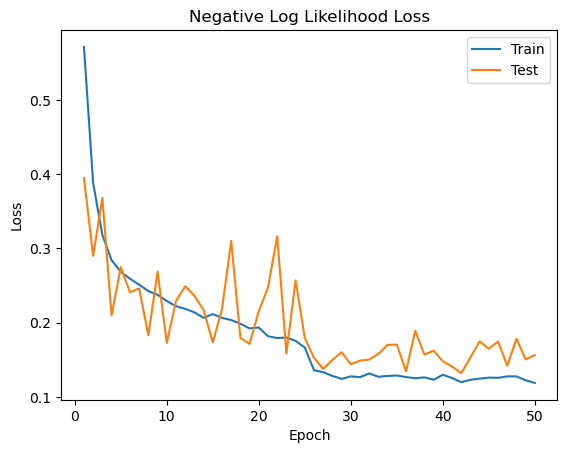

In [27]:
plt.plot(np.arange(1,len(train_loss_vec)+1), train_loss_vec)
plt.plot(np.arange(1,len(test_loss_vec)+1), test_loss_vec)
# plt.ylim([-1,5])
# plt.xlim([90,100])
plt.legend(['Train', 'Test'])
plt.title('Negative Log Likelihood Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

Text(0, 0.5, 'Loss')

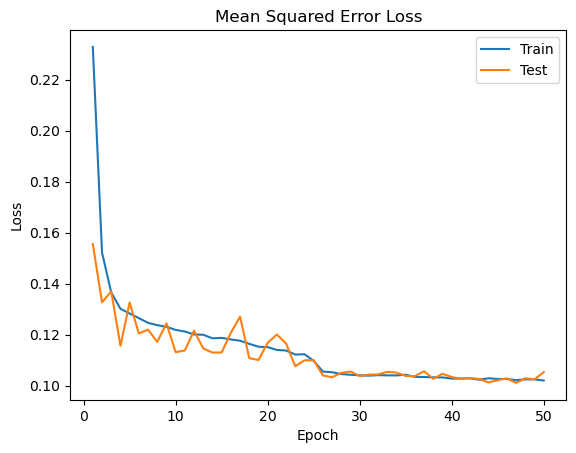

In [28]:
plt.plot(np.arange(1,len(train_mse_vec)+1), train_mse_vec)
plt.plot(np.arange(1,len(test_mse_vec)+1), test_mse_vec)
# plt.ylim([0,1])
plt.title('Mean Squared Error Loss')
plt.legend(['Train', 'Test'])
plt.xlabel('Epoch')
plt.ylabel('Loss')

In [29]:
training_notes = {
    'trainsetsize': len(train_dataset),
    'bursts': 'all',
    'total_params': model.num_parameters(),
    'step size': step_size,
    'gamma': gamma,
    'other': "summer model, aurora data", 
}

In [30]:
# Save model
from datetime import datetime

now = datetime.now()
now = now.strftime("%m-%d-%Y %H:%M")

folder_path = 'models'
file_name = f'{rnn_config["type"]}_{now}.pth'
full_path = f'{folder_path}/{file_name}'

torch.save(model.state_dict(), full_path)

dicts = [train_config, rnn_config, training_notes] 

# File path to save the output
file_path = f'models/{rnn_config["type"]}_{now}.txt'

# Open the file in write mode
with open(file_path, 'w') as file:
    for dictionary in dicts:
        for key, value in dictionary.items():
            file.write(f"  {key}: {value}\n")
        file.write("\n")  # Add a blank line between dictionaries

print(f'Dictionaries have been saved to {file_path}')

torch.save(train_loss_vec, 'models/train_loss_1122.pt')
torch.save(test_loss_vec, 'models/test_loss_1122.pt')
torch.save(train_mse_vec, 'models/train_mse_loss_1122.pt')
torch.save(test_mse_vec, 'models/test_mse_loss_1122.pt')

Dictionaries have been saved to models/RNN_11-22-2024 20:23.txt


In [31]:
import IPython
app = IPython.get_ipython()
app.kernel.do_shutdown(restart=False)

{'status': 'ok', 'restart': False}

## Save loss curves figures

In [11]:
train_loss = torch.load('models/train_loss_1031.pt', weights_only=True) #train_loss_1122.pt
print(train_loss[-1])
test_loss = torch.load('models/test_loss_1031.pt',weights_only=True)
print(test_loss[-1])

0.2021564657954651
0.27911331657994337


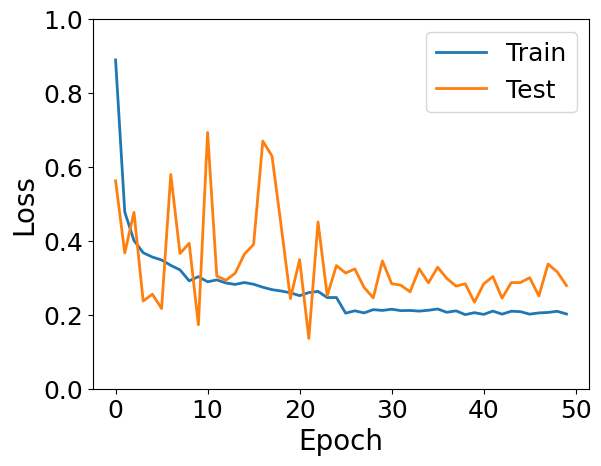

In [9]:
plt.plot(train_loss, linewidth=2)
plt.plot(test_loss, linewidth=2)
plt.xlabel('Epoch', fontsize=20)
plt.ylabel('Loss', fontsize=20)
plt.tick_params(labelsize=18)
plt.ylim([0,1])
plt.legend(["Train","Test"], fontsize=18)

# plt.savefig('figs/tf_loss_curve.png', dpi=200, bbox_inches='tight', pad_inches=0)

In [16]:
def rolling_average_1d(data: list, window_size: int) -> list:
    """
    Compute the rolling average of a 1D Python list.
    
    Args:
        data (list): Input 1D list of numerical values.
        window_size (int): The size of the moving window for the rolling average.

    Returns:
        list: The rolling average as a list.
    """
    if not isinstance(data, list):
        raise ValueError("Input must be a list.")
    if window_size < 1:
        raise ValueError("Window size must be at least 1.")
    if len(data) < window_size:
        raise ValueError("Window size must be smaller than or equal to the length of the list.")

    # Compute the rolling average
    rolling_avg = [
        sum(data[i:i + window_size]) / window_size
        for i in range(len(data) - window_size + 1)
    ]
    
    return rolling_avg

(0.0, 1.0)

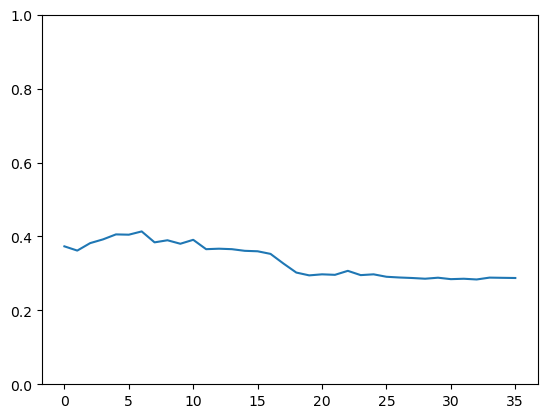

In [22]:
vec = rolling_average_1d(test_loss, window_size = 15)
plt.plot(vec)
plt.ylim([0,1])

In [34]:
train_loss = torch.load('models/train_loss_1120_2.pt')
print(train_loss[-1])
test_loss = torch.load('models/test_loss_1120_2.pt')
print(test_loss[-1])

0.2092705885347641
0.2871178062875212


/tmp/ipykernel_133437/3267293437.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  train_loss = torch.load('models/train_loss_1120_2.pt')
/tmp/ipykernel_133437/3267293437.

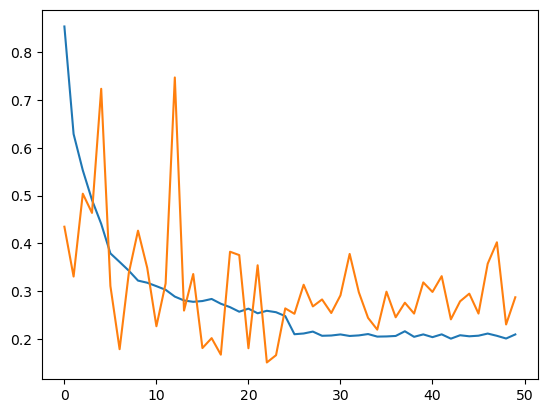

In [35]:
plt.plot(train_loss)
plt.plot(test_loss)

# Validation

In [4]:
device = 'cuda'

### Landslide

tensor([-3.4028e+38,  0.0000e+00,  1.0000e+00])
tensor([-1.,  0.,  1.])
torch.Size([1, 1669, 3440])
torch.Size([192, 192])
tensor([0., 1.])


(np.float64(-0.5), np.float64(191.5), np.float64(191.5), np.float64(-0.5))

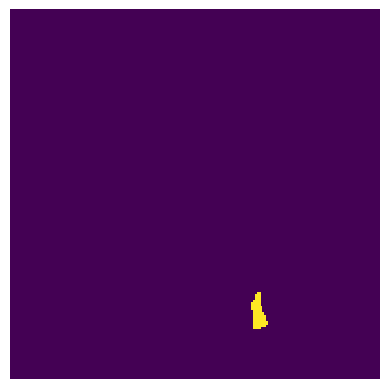

In [5]:
from PIL import Image
from torchvision.transforms import ToTensor

# load mask

target = Image.open('ValidationData/PNG_Landslide_Mask.tif')
target = ToTensor()(target)

print(torch.unique(target))
target[target<-1] = -1
print(torch.unique(target))

print(target.shape)

target_landslide = target[0,1248:1440,448:640] # smaller scene with landslide
print(target_landslide.shape)
print(torch.unique(target_landslide))

plt.imshow(target_landslide, interpolation='None')
plt.axis('off')

In [14]:
landslide = torch.load('ValidationData/landslide_chip.pt')
print(landslide.shape)
landslide = landslide[9:20,:,:,:] # get 10 pre images + 1 post event image
print(landslide.shape)
landslide_logit = torch.special.logit(landslide).float()

pre_landslide = landslide_logit[:-1, :, : , :].unsqueeze(dim=0)
post_landslide = landslide_logit[-1, :, : , :].unsqueeze(dim=0)

print(pre_landslide.shape)
print(post_landslide.shape)

pre_landslide = pre_landslide.to(device)

torch.Size([24, 2, 192, 192])
torch.Size([11, 2, 192, 192])
torch.Size([1, 10, 2, 192, 192])
torch.Size([1, 2, 192, 192])


/tmp/ipykernel_144358/437826065.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  landslide = torch.load('ValidationData/landslide_chip.pt')


([], [])

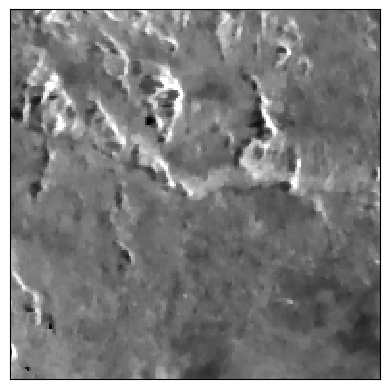

In [58]:
plt.imshow(landslide[-2, 0, ...], interpolation='None', cmap='gray', vmax=.4)
plt.xticks([])
plt.yticks([])
# plt.savefig("figs/pre_landslide_diagram_4.png", dpi=200, bbox_inches='tight', pad_inches=0)

### Chile Fire

In [29]:
# row_min = 1700
# row_max = row_min+224*5
# col_min = 800
# col_max = col_min+224*5

row_min = 1500
row_max = row_min+224*7
col_min = 1000
col_max = col_min+224*5

torch.Size([1568, 1120])


(np.float64(-0.5), np.float64(1119.5), np.float64(1567.5), np.float64(-0.5))

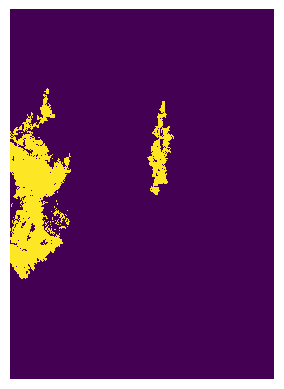

In [30]:
target_fire = torch.load('ValidationData/fire_mask.pt',weights_only=True)
# target_mask = target_mask[1504:,1000:]
target_fire = target_fire[row_min:row_max,col_min:col_max]
print(target_fire.shape)
plt.imshow(target_fire, interpolation='none')
plt.axis('off')

torch.Size([10, 2, 4160, 3008])
torch.Size([10, 2, 1568, 1120])


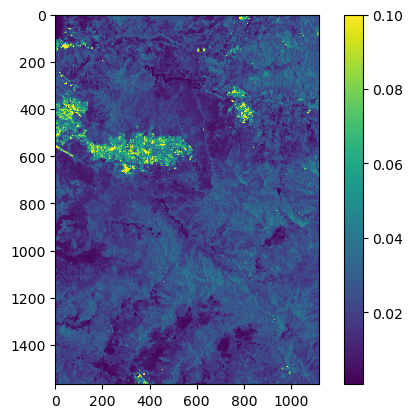

In [11]:
fire_data = torch.load('ValidationData/fire_val_data.pt', weights_only=True)
print(fire_data.shape)
fire_data = fire_data[:,:,row_min:row_max,col_min:col_max]
print(fire_data.shape)
plt.imshow(fire_data[-1,1,...], interpolation='none',vmax=.1)
plt.colorbar()

torch.float32


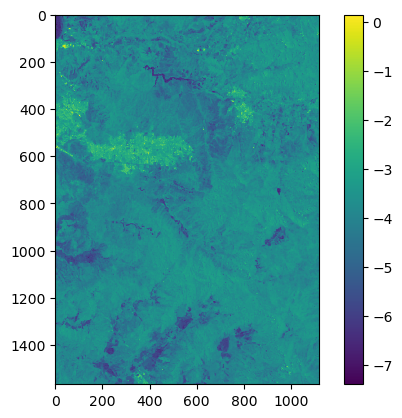

In [12]:
fire_data_logit = torch.special.logit(fire_data).float()
print(fire_data_logit.dtype)

plt.imshow(fire_data_logit[-1,1,...], interpolation='none')
plt.colorbar()

In [13]:
device = 'cuda'
pre_fire = fire_data_logit[:7, :, : , :].unsqueeze(dim=0).to(device) # we have 7 pre fire images
post_fire = fire_data_logit[-1, :, : , :].unsqueeze(dim=0)

print(pre_fire.shape)
print(post_fire.shape)

torch.Size([1, 7, 2, 1568, 1120])
torch.Size([1, 2, 1568, 1120])


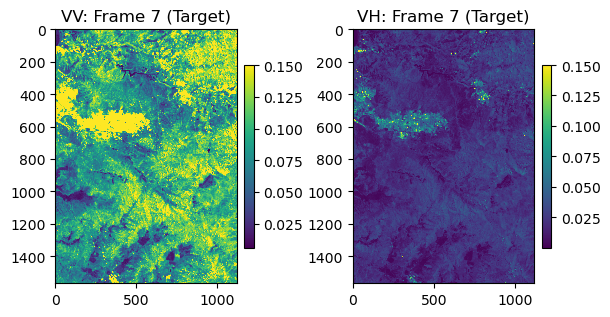

In [10]:
from IPython.display import HTML

ani = animate_data(pre_fire[0,...].cpu(), post_fire[0,...], interval=500, vmax=.15)

HTML(ani.to_jshtml())

### Flood

torch.Size([2688, 2240])
torch.Size([1440, 992])


/tmp/ipykernel_117350/397379432.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  target_bangladesh = torch.load('ValidationData/bangladesh_map.pt')


(np.float64(-0.5), np.float64(991.5), np.float64(1439.5), np.float64(-0.5))

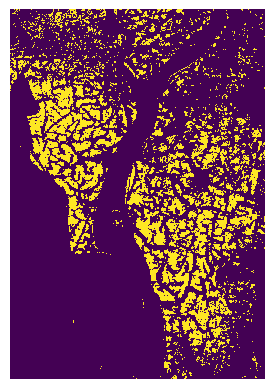

In [31]:
target_bangladesh = torch.load('ValidationData/bangladesh_map.pt')
print(target_bangladesh.shape)
target_bangladesh = target_bangladesh[1248:,1248:]
print(target_bangladesh.shape)
plt.imshow(target_bangladesh, interpolation='none')
# plt.colorbar()
plt.axis('off')

In [15]:
bangladesh_data = torch.load('ValidationData/bangladesh_val_data.pt')
bangladesh_data = bangladesh_data[:,:,1248:,1248:]
print(bangladesh_data.shape)

/tmp/ipykernel_158117/3362094384.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  bangladesh_data = torch.load('ValidationData/bangladesh_val_data.pt')


torch.Size([7, 2, 1440, 992])


In [16]:
bangladesh_logit = torch.special.logit(bangladesh_data).float()
print(bangladesh_logit.dtype)

pre_bangladesh = bangladesh_logit[:4, :, : , :].unsqueeze(dim=0).to(device) # we only have 4 images before flooding began
post_bangladesh = bangladesh_logit[-1, :, : , :].unsqueeze(dim=0) # july 5

print(pre_bangladesh.shape)
print(post_bangladesh.shape)

torch.float32
torch.Size([1, 4, 2, 1440, 992])
torch.Size([1, 2, 1440, 992])


## Inference

### Non-autoregressive

In [24]:
def make_preds_sliding(model, pre_imgs, chip_size=8, stride=1, flatten = True):
  '''
  pre_imgs: (Batch, Time, Channels, Height, Width) (Batch == 1)
  '''

  assert stride <= chip_size
  assert stride > 0

  data_dim_row = pre_imgs.shape[-2]
  data_dim_col = pre_imgs.shape[-1]

  assert data_dim_row % chip_size == 0
  assert data_dim_col % chip_size == 0

  pred_means = torch.zeros((1,2,data_dim_row,data_dim_col), device=pre_imgs.device)
  pred_logvars = torch.zeros_like(pred_means)
  div_mat = torch.zeros_like(pred_means)

  index_range_row = int(data_dim_row - chip_size + 1)
  index_range_col = int(data_dim_col - chip_size + 1)

  model.eval() # account for dropout, etc
  with torch.no_grad(): # tells torch it doesn't need to keep track of gradients

    for i in tqdm(range(0,index_range_row,stride)):
      for j in range(0,index_range_col,stride):

        if flatten:
          chip_mean, chip_logvar = model(pre_imgs[:,:,:,i:(i+chip_size),j:(j+chip_size)].flatten(start_dim=2))
        else:
          chip_mean, chip_logvar = model(pre_imgs[:,:,:,i:(i+chip_size),j:(j+chip_size)])

        pred_means[:,:,i:(i+chip_size),j:(j+chip_size)] += chip_mean.reshape((1,2,chip_size,chip_size))
        pred_logvars[:,:,i:(i+chip_size),j:(j+chip_size)] += chip_logvar.reshape((1,2,chip_size,chip_size))
        div_mat[:,:,i:(i+chip_size),j:(j+chip_size)] += 1 #count how many times we hit a certain pixel

  pred_means = pred_means / div_mat
  pred_logvars = pred_logvars / div_mat

  return pred_means, pred_logvars

### Autoregressive

In [47]:
def make_preds_sliding(model, pre_imgs, chip_size=8, stride=1, flatten = True):
  '''
  pre_imgs: (Batch, Time, Channels, Height, Width) (Batch == 1)
  '''

  assert stride <= chip_size
  assert stride > 0

  data_dim_row = pre_imgs.shape[-2]
  data_dim_col = pre_imgs.shape[-1]

  assert data_dim_row % chip_size == 0
  assert data_dim_col % chip_size == 0

  pred_means = torch.zeros((1,2,data_dim_row,data_dim_col), device=pre_imgs.device)
  pred_logvars = torch.zeros_like(pred_means)
  div_mat = torch.zeros_like(pred_means)

  index_range_row = int(data_dim_row - chip_size + 1)
  index_range_col = int(data_dim_col - chip_size + 1)

  model.eval() # account for dropout, etc
  with torch.no_grad(): # tells torch it doesn't need to keep track of gradients

    for i in tqdm(range(0,index_range_row,stride)):
      for j in range(0,index_range_col,stride):

        if flatten:
          chip_mean, chip_logvar = model(pre_imgs[:,:,:,i:(i+chip_size),j:(j+chip_size)].flatten(start_dim=2))
        else:
          chip_mean, chip_logvar = model(pre_imgs[:,:,:,i:(i+chip_size),j:(j+chip_size)])

          # get just the last one, since the model outputs predictions at each timesteps
          chip_mean = chip_mean[:,-1,...]
          chip_logvar = chip_logvar[:,-1,...]

        pred_means[:,:,i:(i+chip_size),j:(j+chip_size)] += chip_mean.reshape((1,2,chip_size,chip_size))
        pred_logvars[:,:,i:(i+chip_size),j:(j+chip_size)] += chip_logvar.reshape((1,2,chip_size,chip_size))
        div_mat[:,:,i:(i+chip_size),j:(j+chip_size)] += 1 #count how many times we hit a certain pixel

  pred_means = pred_means / div_mat
  pred_logvars = pred_logvars / div_mat

  return pred_means, pred_logvars

### Eval

In [25]:
transformer = SpatioTemporalTransformer(tf_config).to(device)
transformer.load_state_dict(torch.load(f"models/transformer_10-31-2024 18:20.pth"))
print("Number of parameters: ", transformer.num_parameters())

rnn = RNN(rnn_config).to(device)
rnn.load_state_dict(torch.load(f"models/RNN_11-22-2024 20:23.pth"))
print("Number of parameters: ", rnn.num_parameters())

#RNN_11-22-2024 20:23
#rnn_11-21-2024 23:54

/tmp/ipykernel_144358/2013213287.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  transformer.load_state_dict(torch.load(f"models/transformer_10-31-2024 18:20.pth"))


Number of parameters:  3261952


NameError: name 'RNN' is not defined

In [28]:
event = 'New Guinea Landslide'

if event == 'New Guinea Landslide':
  pre_imgs = pre_landslide
  post_img = post_landslide
  target_mask = target_landslide
  stride=1
  name_event = 'landslide' # for saving figs
elif event == 'Chile Fire':
  pre_imgs = pre_fire
  post_img = post_fire
  target_mask = target_fire
  stride=4
  name_event = 'fire'
elif event == 'Bangladesh Flood':
  pre_imgs = pre_bangladesh
  post_img = post_bangladesh
  target_mask = target_bangladesh
  stride=4
  name_event = 'flood'
else:
  raise NotImplementedError

# rnn_means, rnn_logvars = make_preds_sliding(rnn, pre_imgs[:, :-1, ...], chip_size=8, stride=stride)
tf_means, tf_logvars = make_preds_sliding(transformer, pre_imgs[:, :-1, ...], chip_size=16, flatten=False, stride=stride)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 177/177 [00:40<00:00,  4.41it/s]


In [29]:
tf_means.shape

torch.Size([1, 2, 192, 192])

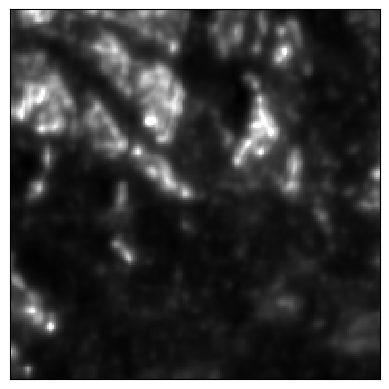

In [48]:
plt.imshow(np.sqrt(np.exp(tf_logvars[0,0,...].detach().cpu().numpy())), interpolation='none', cmap='gray', vmax=.3)
plt.xticks([])
plt.yticks([])
plt.savefig("figs/tf_std_diagram.png", dpi=200, bbox_inches='tight', pad_inches=0)

In [51]:
dam = compute_damage_map(tf_means[0,0,...], tf_logvars[0,0,...], post_landslide[0,0,...])

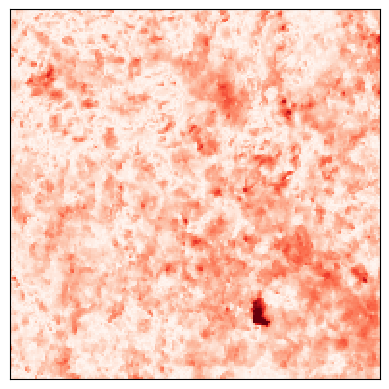

In [56]:
plt.imshow(dam, interpolation='none', cmap='Reds', vmax=8)
plt.xticks([])
plt.yticks([])
plt.savefig("figs/dam_map_diagram.png", dpi=200, bbox_inches='tight', pad_inches=0)

### Viz

tensor(4.8329)
tensor(4.7684e-06)
tensor(0.3695)
tensor(0.0756)
tensor(0.3349)
tensor(0.0732)
tensor(8.4966)


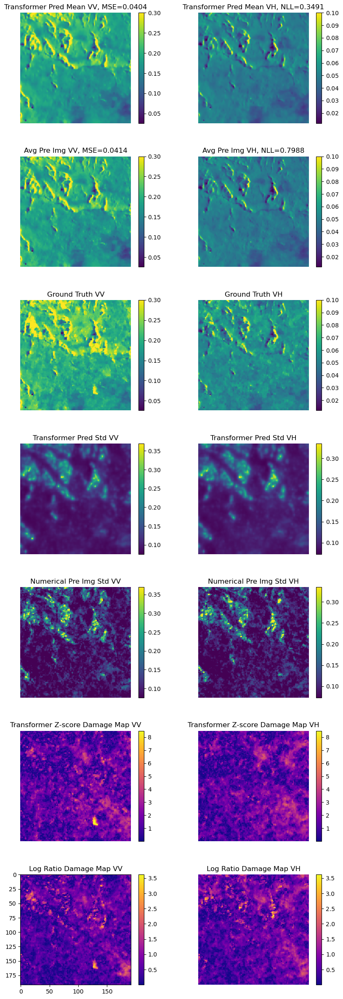

In [32]:
tf_damage_map, log_ratio_im = visualize_reconstruction(pre_imgs[0,...], post_img[0,...], tf_means[0,...], tf_logvars[0,...], 'Transformer', is_logit=True, vmax_vv=.3, vmax_vh=.1)

tensor(4.7595)
tensor(1.1921e-06)
tensor(0.3695)
tensor(0.0756)
tensor(0.3349)
tensor(0.0732)
tensor(4.5463)


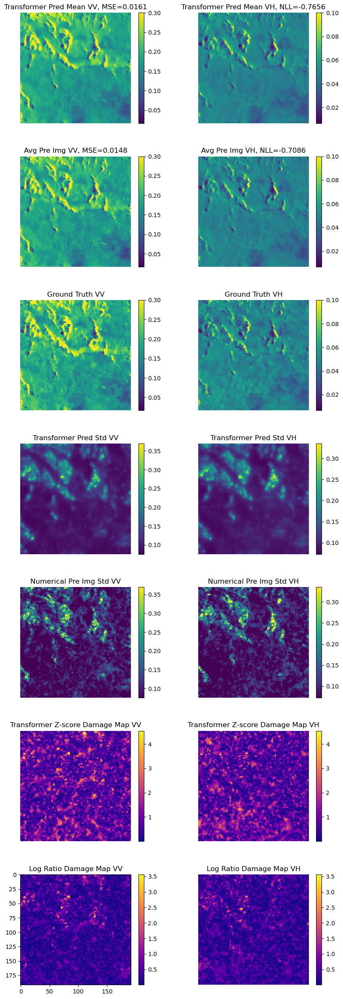

In [33]:
# non damaged scene:
tf_damage_map, log_ratio_im = visualize_reconstruction(pre_imgs[0, :-1, ...], pre_imgs[0, -1, ...], tf_means[0,...], tf_logvars[0,...], 'Transformer', is_logit=True, vmax_vv=.3, vmax_vh=.1)

### Helpers

In [49]:
from sklearn.metrics import precision_recall_curve, roc_curve, roc_auc_score, auc, average_precision_score

def compute_roc(pred_map, target_map):
  '''
  Computes num_maps of binary damage maps based on input
  pred_map (ie log ratio, z-score, etc)
  '''
  assert pred_map.shape == target_map.shape

  target_map = target_map.flatten().cpu().numpy()
  pred_map = pred_map.flatten().cpu().numpy()

  precisions, recalls, thresholds = precision_recall_curve(target_map, pred_map)
  fprs, tprs, _ = roc_curve(target_map, pred_map)

  f1_scores = 2*recalls*precisions/(recalls+precisions)
  f1_scores[np.isnan(f1_scores)] = 0

  roc_auc = roc_auc_score(target_map, pred_map)

  pr_auc = average_precision_score(target_map, pred_map)

  # put metrics into a dictionary

  metrics = {'precisions': precisions,
             'recalls': recalls,
             'fprs': fprs,
             'tprs': tprs,
             'f1_scores': f1_scores,
             'thresholds': thresholds,
             'roc_auc': roc_auc,
             'pr_auc' : pr_auc}

  return metrics

def synthesize_damage_map(damage_map, num_scenes=2, method='max'):
  assert damage_map.shape[num_scenes-1] == 2
  assert num_scenes == 1 or num_scenes==2

  if method not in ['max','sum']:
    raise NotImplementedError('Method must be either max or sum')

  if method == 'max':
    return torch.max(damage_map, dim=num_scenes-1)[0]
  elif method == 'sum':
    # this is mahalanobis distance where we assume correlation (off diagonal terms) are close to 0
    if num_scenes==2:
      return torch.sqrt(damage_map[:, 0, ...]**2 + damage_map[:, 1, ...]**2)
    else:
      return torch.sqrt(damage_map[0, ...]**2 + damage_map[1, ...]**2)

def compute_damage_map(pred_mean, pred_logvar, post_img):
  assert pred_mean.shape == pred_logvar.shape
  assert pred_mean.shape == post_img.shape

  post_img = post_img.cpu()
  pred_mean = pred_mean.cpu()
  pred_logvar = pred_logvar.cpu()

  pred_std_image = torch.sqrt(torch.exp(pred_logvar))
  damage_map = torch.absolute((post_img - pred_mean) / pred_std_image)

  return damage_map

### PR Curves etc

In [44]:
# experiment with non damaged scene + damage scene, per Charlie rec

tf_damage_map1 = compute_damage_map(tf_means[0,...], tf_logvars[0,...], pre_imgs[0, -1, ...]) # no damage
tf_damage_map2 = compute_damage_map(tf_means[0,...], tf_logvars[0,...], post_img[0, ...]) #damage

rnn_damage_map1 = compute_damage_map(rnn_means[0,...], rnn_logvars[0,...], pre_imgs[0, -1, ...])
rnn_damage_map2 = compute_damage_map(rnn_means[0,...], rnn_logvars[0,...], post_img[0, ...])

log_ratio_im1 = log_ratio(pre_imgs[0, :-1, ...].cpu(), pre_imgs[0, -1, ...].cpu(), is_logit=True, method='mean')
log_ratio_im2 = log_ratio(pre_imgs[0, :-1, ...].cpu(), post_img[0,...], is_logit=True, method='mean')

log_ratio_median1 = log_ratio(pre_imgs[0, :-1, ...].cpu(), pre_imgs[0, -1, ...].cpu(), is_logit=True, method='median')
log_ratio_median2 = log_ratio(pre_imgs[0,...].cpu(), post_img[0,...], is_logit=True, method='median')

tf_damage_map = torch.stack((tf_damage_map1, tf_damage_map2))
rnn_damage_map = torch.stack((rnn_damage_map1, rnn_damage_map2))
log_ratio_im = torch.stack((log_ratio_im1, log_ratio_im2))
log_ratio_median = torch.stack((log_ratio_median1, log_ratio_median2))

In [72]:
max_tf_map = torch.load(f"results/{name_event}_tf_damage_maps.pt", weights_only=True)
max_rnn_map = torch.load(f"results/{name_event}_rnn_damage_maps.pt", weights_only=True)
max_med_map = torch.load(f"results/{name_event}_med_damage_maps.pt", weights_only=True)

In [73]:
# method = 'max' # can be max or sum

# max_tf_map = synthesize_damage_map(tf_damage_map, method=method)
# max_rnn_map = synthesize_damage_map(rnn_damage_map, method=method)
# max_mean_map = synthesize_damage_map(log_ratio_im, method='max')
# max_med_map = synthesize_damage_map(log_ratio_median, method='max')

two_scene_target = torch.stack((torch.zeros_like(target_mask),target_mask))

model_metrics = compute_roc(max_tf_map, two_scene_target)
rnn_metrics = compute_roc(max_rnn_map, two_scene_target)
# mean_metrics = compute_roc(max_mean_map, two_scene_target)
med_metrics = compute_roc(max_med_map, two_scene_target)

baseline_pr = torch.sum(two_scene_target)/(two_scene_target.shape[0]*two_scene_target.shape[1]*two_scene_target.shape[2])
print(baseline_pr)

/tmp/ipykernel_117350/1522763551.py:16: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2*recalls*precisions/(recalls+precisions)


tensor(0.0328)


In [46]:
# torch.save(max_tf_map, f"results/{name_event}_tf_damage_maps.pt")
# torch.save(max_rnn_map, f"results/{name_event}_rnn_damage_maps.pt")
# torch.save(max_mean_map, f"results/{name_event}_mean_damage_maps.pt")
# torch.save(max_med_map, f"results/{name_event}_med_damage_maps.pt")

In [47]:
# def plot_best_map(model_metrics, damage_map):

#   best_threshold = model_metrics['thresholds'][np.argmax(model_metrics['f1_scores'])]
#   best_damage_map = damage_map.cpu() > best_threshold

#   return best_damage_map

# tf_best_damage_map = plot_best_map(model_metrics, max_tf_map)
# rnn_best_damage_map = plot_best_map(rnn_metrics, max_rnn_map)
# mean_best_damage_map = plot_best_map(mean_metrics, max_mean_map)
# med_best_damage_map = plot_best_map(med_metrics, max_med_map)

In [48]:
# torch.save(tf_best_damage_map, f"results/{name_event}_tf_best.pt")
# torch.save(rnn_best_damage_map, f"results/{name_event}_rnn_best.pt")
# torch.save(mean_best_damage_map, f"results/{name_event}_mean_best.pt")
# torch.save(med_best_damage_map, f"results/{name_event}_med_best.pt")

In [74]:
print("TF AUC: ", model_metrics['pr_auc'])
print("TF F1: ", np.max(model_metrics['f1_scores']))

print("RNN AUC: ", rnn_metrics['pr_auc'])
print("RNN F1: ", np.max(rnn_metrics['f1_scores']))

# print(mean_metrics['pr_auc'])
# print(np.max(mean_metrics['f1_scores']))

print(med_metrics['pr_auc'])
print(np.max(med_metrics['f1_scores']))

TF AUC:  0.6800262503347112
TF F1:  0.6452177038954983
RNN AUC:  0.6241594555825251
RNN F1:  0.596468617089831
0.39072597174024476
0.47371107708014293


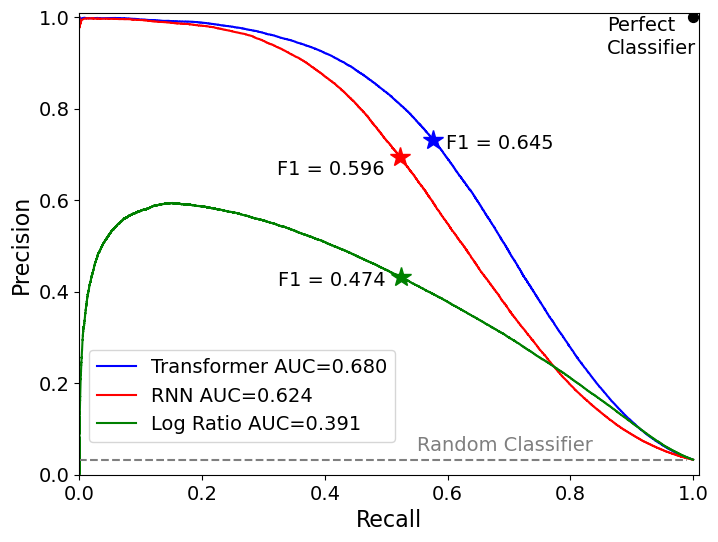

In [82]:
plt.figure(figsize=(8,6))

plt.plot(model_metrics['recalls'],model_metrics['precisions'],'b')
plt.plot(rnn_metrics['recalls'][:-1],rnn_metrics['precisions'][:-1],'r')
# plt.plot(mean_metrics['recalls'][:-1],mean_metrics['precisions'][:-1],'r')
plt.plot(med_metrics['recalls'][:-1],med_metrics['precisions'][:-1],'g')
plt.plot(np.arange(0,1,.01),torch.ones(100)*baseline_pr,linestyle='dashed',color='tab:grey')
plt.scatter(1,1,c='k',s=50)

plt.plot(model_metrics['recalls'][np.argmax(model_metrics['f1_scores'])],model_metrics['precisions'][np.argmax(model_metrics['f1_scores'])],'b*',markersize=15)
plt.annotate('F1 = {:.3f}'.format(np.max(model_metrics['f1_scores'])),
 (model_metrics['recalls'][np.argmax(model_metrics['f1_scores'])]+.02,model_metrics['precisions'][np.argmax(model_metrics['f1_scores'])]-.02), 
             fontsize=14
 )

plt.plot(rnn_metrics['recalls'][np.argmax(rnn_metrics['f1_scores'])],rnn_metrics['precisions'][np.argmax(rnn_metrics['f1_scores'])],'r*',markersize=15)
plt.annotate('F1 = {:.3f}'.format(np.max(rnn_metrics['f1_scores'])),
(rnn_metrics['recalls'][np.argmax(rnn_metrics['f1_scores'])]-.2,rnn_metrics['precisions'][np.argmax(rnn_metrics['f1_scores'])]-.04),
             fontsize=14
)

# plt.plot(mean_metrics['recalls'][np.argmax(mean_metrics['f1_scores'])],mean_metrics['precisions'][np.argmax(mean_metrics['f1_scores'])],'r*',markersize=15)
# plt.annotate('F1 = {:.3f}'.format(np.max(mean_metrics['f1_scores'])),
#  (mean_metrics['recalls'][np.argmax(mean_metrics['f1_scores'])]+.02,mean_metrics['precisions'][np.argmax(mean_metrics['f1_scores'])]-.01),
#              fontsize=14
#  )

plt.plot(med_metrics['recalls'][np.argmax(med_metrics['f1_scores'])],med_metrics['precisions'][np.argmax(med_metrics['f1_scores'])],'g*',markersize=15)
plt.annotate('F1 = {:.3f}'.format(np.max(med_metrics['f1_scores'])),
 (med_metrics['recalls'][np.argmax(med_metrics['f1_scores'])]-.2,med_metrics['precisions'][np.argmax(med_metrics['f1_scores'])]-.02),
             fontsize=14
 )

plt.annotate("Random Classifier",(0.55,baseline_pr+.02), c='tab:grey', fontsize=14)
plt.annotate("Perfect",(.86,.97),fontsize=14)
plt.annotate("Classifier",(.86,.92),fontsize=14)

plt.legend(['Transformer AUC={:.3f}'.format(model_metrics['pr_auc']),
            'RNN AUC={:.3f}'.format(rnn_metrics['pr_auc']),
            'Log Ratio AUC={:.3f}'.format(med_metrics['pr_auc']), #'Log Ratio (Mean) AUC={:.3f}'.format(mean_metrics['pr_auc']),
  ], fontsize=14,loc='lower left', bbox_to_anchor=(0, 0.05))
plt.xlabel("Recall", fontsize=16)
plt.ylabel("Precision",fontsize=16)

plt.tick_params(axis='both', which='major', labelsize=14) 
plt.ylim(bottom=0, top=1.01)
plt.xlim(left=0, right=1.01)

# channel_name = 'VV' if channel==0 else 'VH'
# channel_name = 'Both'
# plt.title(f"Precision-Recall Curve for {event}") #, Method={method}")

plt.savefig(f"figs/{name_event}_PR.png", dpi=200, bbox_inches='tight', pad_inches=0)

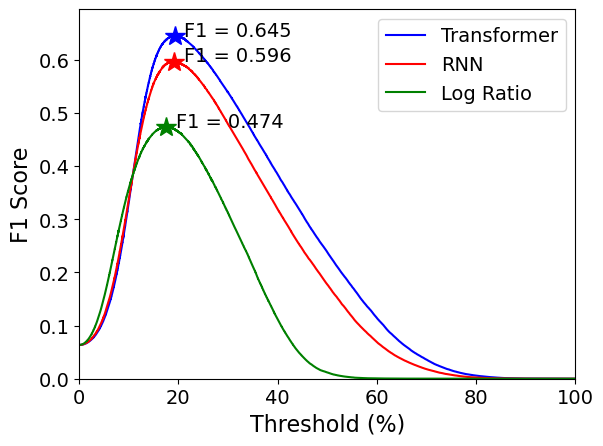

In [86]:
fig, ax = plt.subplots()

fig.set_figheight(4.8)
fig.set_figwidth(6.4)

ax.plot(100*model_metrics['thresholds']/model_metrics['thresholds'][-1],model_metrics['f1_scores'][:-1],'b')
ax.plot(100*rnn_metrics['thresholds']/rnn_metrics['thresholds'][-1],rnn_metrics['f1_scores'][:-1],'r')
# ax.plot(100*mean_metrics['thresholds']/mean_metrics['thresholds'][-1],mean_metrics['f1_scores'][:-1],'r')
ax.plot(100*med_metrics['thresholds']/med_metrics['thresholds'][-1],med_metrics['f1_scores'][:-1],'g')

ax.set_xlabel('Threshold (%)', fontsize=16)
ax.set_ylabel('F1 Score',fontsize=16)
ax.set_ylim(0,model_metrics['f1_scores'][np.argmax(model_metrics['f1_scores'])]+.05)
ax.set_xlim(0,100)
ax.tick_params(axis='both', which='major', labelsize=14) 

ax.plot(100*model_metrics['thresholds'][np.argmax(model_metrics['f1_scores'])]/model_metrics['thresholds'][-1],
           model_metrics['f1_scores'][np.argmax(model_metrics['f1_scores'])],'b*',markersize=15)
ax.annotate('F1 = {:.3f}'.format(np.max(model_metrics['f1_scores'])),
 (100*model_metrics['thresholds'][np.argmax(model_metrics['f1_scores'])]/model_metrics['thresholds'][-1] + 2,
  model_metrics['f1_scores'][np.argmax(model_metrics['f1_scores'])]), fontsize = 14
 ) 

ax.plot(100*rnn_metrics['thresholds'][np.argmax(rnn_metrics['f1_scores'])]/rnn_metrics['thresholds'][-1],
           rnn_metrics['f1_scores'][np.argmax(rnn_metrics['f1_scores'])],'r*',markersize=15)
ax.annotate('F1 = {:.3f}'.format(np.max(rnn_metrics['f1_scores'])),
 (100*rnn_metrics['thresholds'][np.argmax(rnn_metrics['f1_scores'])]/rnn_metrics['thresholds'][-1] + 2,
  rnn_metrics['f1_scores'][np.argmax(rnn_metrics['f1_scores'])]), fontsize = 14
 )

# ax.plot(100*mean_metrics['thresholds'][np.argmax(mean_metrics['f1_scores'])]/mean_metrics['thresholds'][-1],
#            mean_metrics['f1_scores'][np.argmax(mean_metrics['f1_scores'])],'r*',markersize=15)
# ax.annotate('F1 = {:.3f}'.format(np.max(mean_metrics['f1_scores'])),
#  (100*mean_metrics['thresholds'][np.argmax(mean_metrics['f1_scores'])]/mean_metrics['thresholds'][-1] + 2,
#   mean_metrics['f1_scores'][np.argmax(mean_metrics['f1_scores'])]), fontsize = 14
#  )

ax.plot(100*med_metrics['thresholds'][np.argmax(med_metrics['f1_scores'])]/med_metrics['thresholds'][-1],
           med_metrics['f1_scores'][np.argmax(med_metrics['f1_scores'])],'g*',markersize=15)
ax.annotate('F1 = {:.3f}'.format(np.max(med_metrics['f1_scores'])),
 (100*med_metrics['thresholds'][np.argmax(med_metrics['f1_scores'])]/med_metrics['thresholds'][-1] + 2,
  med_metrics['f1_scores'][np.argmax(med_metrics['f1_scores'])]), fontsize = 14
 )

plt.legend(['Transformer',
            'RNN',
            'Log Ratio',
  ], fontsize=14,loc='upper right')

plt.savefig(f"figs/{name_event}_threshold.png", dpi=200, bbox_inches='tight', pad_inches=0.1)

### TF Threshold comparison

In [92]:
landslide_map = torch.load(f"results/landslide_tf_damage_maps.pt", weights_only=True)
fire_map = torch.load(f"results/fire_tf_damage_maps.pt", weights_only=True)
flood_map = torch.load(f"results/flood_tf_damage_maps.pt", weights_only=True)

In [93]:
two_scene_target_landslide = torch.stack((torch.zeros_like(target_landslide),target_landslide))
two_scene_target_fire = torch.stack((torch.zeros_like(target_fire),target_fire))
two_scene_target_flood = torch.stack((torch.zeros_like(target_bangladesh),target_bangladesh))

landslide_metrics = compute_roc(landslide_map, two_scene_target_landslide)
fire_metrics = compute_roc(fire_map, two_scene_target_fire)
flood_metrics = compute_roc(flood_map, two_scene_target_flood)

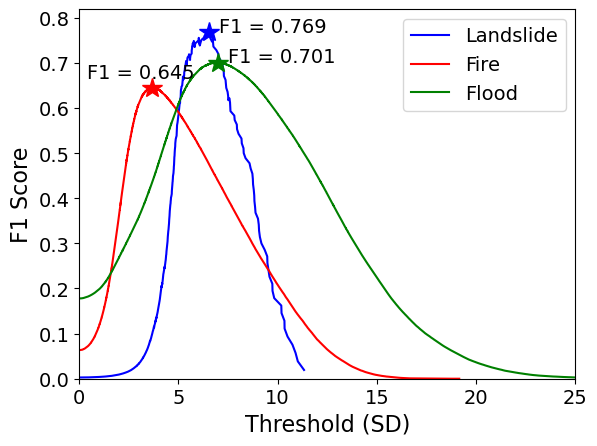

In [106]:
model_metrics = landslide_metrics
rnn_metrics = fire_metrics
med_metrics = flood_metrics

fig, ax = plt.subplots()

fig.set_figheight(4.8)
fig.set_figwidth(6.4)

ax.plot(model_metrics['thresholds'],model_metrics['f1_scores'][:-1],'b')
ax.plot(rnn_metrics['thresholds'],rnn_metrics['f1_scores'][:-1],'r')
ax.plot(med_metrics['thresholds'],med_metrics['f1_scores'][:-1],'g')

ax.set_xlabel('Threshold (SD)', fontsize=16)
ax.set_ylabel('F1 Score',fontsize=16)
ax.set_ylim(0,model_metrics['f1_scores'][np.argmax(model_metrics['f1_scores'])]+.05)
ax.set_xlim(0,25)
ax.tick_params(axis='both', which='major', labelsize=14) 

ax.plot(model_metrics['thresholds'][np.argmax(model_metrics['f1_scores'])],
           model_metrics['f1_scores'][np.argmax(model_metrics['f1_scores'])],'b*',markersize=15)
ax.annotate('F1 = {:.3f}'.format(np.max(model_metrics['f1_scores'])),
 (model_metrics['thresholds'][np.argmax(model_metrics['f1_scores'])] + .5,
  model_metrics['f1_scores'][np.argmax(model_metrics['f1_scores'])]), fontsize = 14
 ) 

ax.plot(rnn_metrics['thresholds'][np.argmax(rnn_metrics['f1_scores'])],
           rnn_metrics['f1_scores'][np.argmax(rnn_metrics['f1_scores'])],'r*',markersize=15)
ax.annotate('F1 = {:.3f}'.format(np.max(rnn_metrics['f1_scores'])),
 (rnn_metrics['thresholds'][np.argmax(rnn_metrics['f1_scores'])] - 3.3,
  rnn_metrics['f1_scores'][np.argmax(rnn_metrics['f1_scores'])] + .02), fontsize = 14
 )

ax.plot(med_metrics['thresholds'][np.argmax(med_metrics['f1_scores'])],
           med_metrics['f1_scores'][np.argmax(med_metrics['f1_scores'])],'g*',markersize=15)
ax.annotate('F1 = {:.3f}'.format(np.max(med_metrics['f1_scores'])),
 (med_metrics['thresholds'][np.argmax(med_metrics['f1_scores'])] + .5,
  med_metrics['f1_scores'][np.argmax(med_metrics['f1_scores'])]), fontsize = 14
 )

plt.legend(['Landslide',
            'Fire',
            'Flood',
  ], fontsize=14,loc='upper right')

plt.savefig(f"figs/tf_all_threshold.png", dpi=200, bbox_inches='tight', pad_inches=0.1)

# Plotting with Contextily and Rasterio

In [3]:
import rasterio

with rasterio.open('ValidationData/copernicus_fire_map.tif') as ds:
    X0 = ds.read(1)

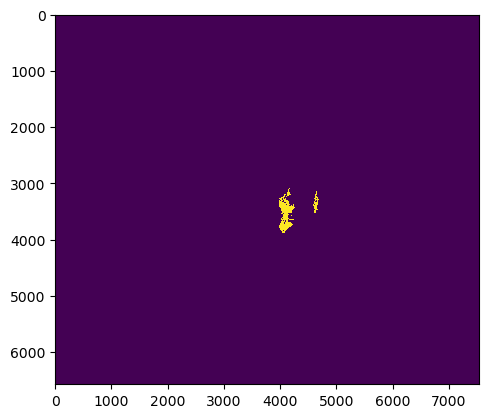

In [4]:
plt.imshow(X0, interpolation='none')

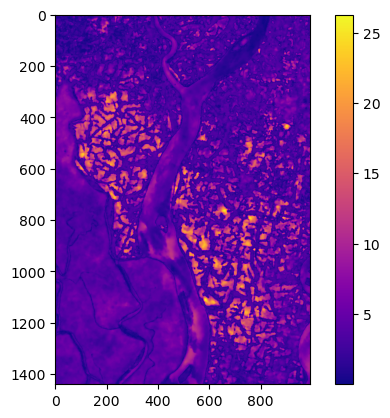

In [205]:
plt.imshow(max_tf_map[-1,...], cmap='plasma')
plt.colorbar()

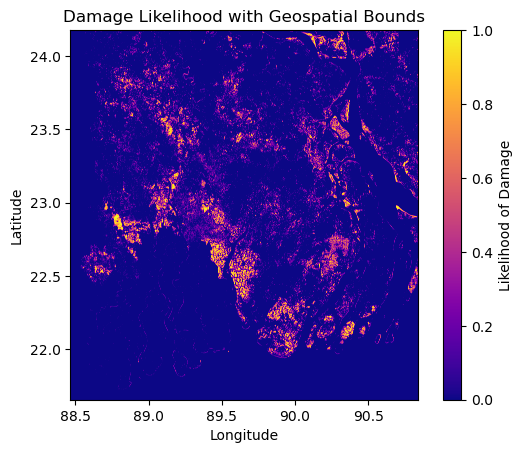

In [287]:
# image = max_tf_map[-1,...]
image = X0
# bounds = [88.96546265, 21.65505773, 91.33990759, 24.17825791] #bangladesh flood
# bounds = [88.965442, 21.654429, 91.198689, 24.178055]
# bounds = [88.96546265-.5, 21.65505773, 91.33990759-.5, 24.17825791]

# bounds = [-71.53071089, -33.20143816, -71.2964628 , -32.98270579] #chile fire

# bounds = [143.3,  -5.4, 143.4,  -5.3] #new guinea landslide

# code here to account for how I chopped up the image, see notebook

# Unpack the bounds
min_lon, min_lat, max_lon, max_lat = bounds

# Plot the image with the extent defined by the bounds
plt.imshow(image, extent=[min_lon, max_lon, min_lat, max_lat], cmap='plasma', origin='upper')
plt.colorbar(label='Likelihood of Damage')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Damage Likelihood with Geospatial Bounds')
plt.show()

In [266]:
# Transform bounds from EPSG:4326 to EPSG:3857
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
min_lon_wm, min_lat_wm = transformer.transform(min_lon, min_lat)
max_lon_wm, max_lat_wm = transformer.transform(max_lon, max_lat)

# Update the extent for the basemap
extent_wm = [min_lon_wm, max_lon_wm, min_lat_wm, max_lat_wm]

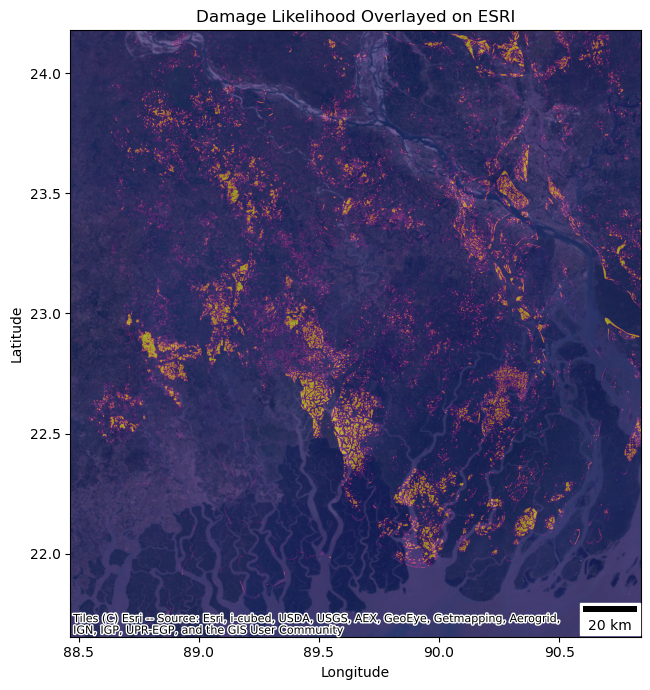

In [288]:
import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar
from pyproj import Geod

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(image, extent=[min_lon, max_lon, min_lat, max_lat], cmap='plasma', alpha=1, origin='upper')

# Add the basemap
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.Esri.WorldImagery, alpha=.5)

# have to do this so scalebar is correct
center_lat = (bounds[1] + bounds[3]) / 2
center_lon = (bounds[0] + bounds[2]) / 2
geod = Geod(ellps="WGS84")
distance_meters, _, _ = geod.inv(center_lon, center_lat, center_lon + 1, center_lat)
scale_factor = distance_meters

scalebar = ScaleBar(scale_factor, units="km", location="lower right", scale_loc="bottom", length_fraction=0.1)
ax.add_artist(scalebar)

# Add labels and title
# plt.colorbar(ax.images[0], ax=ax, label='Likelihood of Damage')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Damage Likelihood Overlayed on ESRI')
plt.tight_layout()
plt.show()

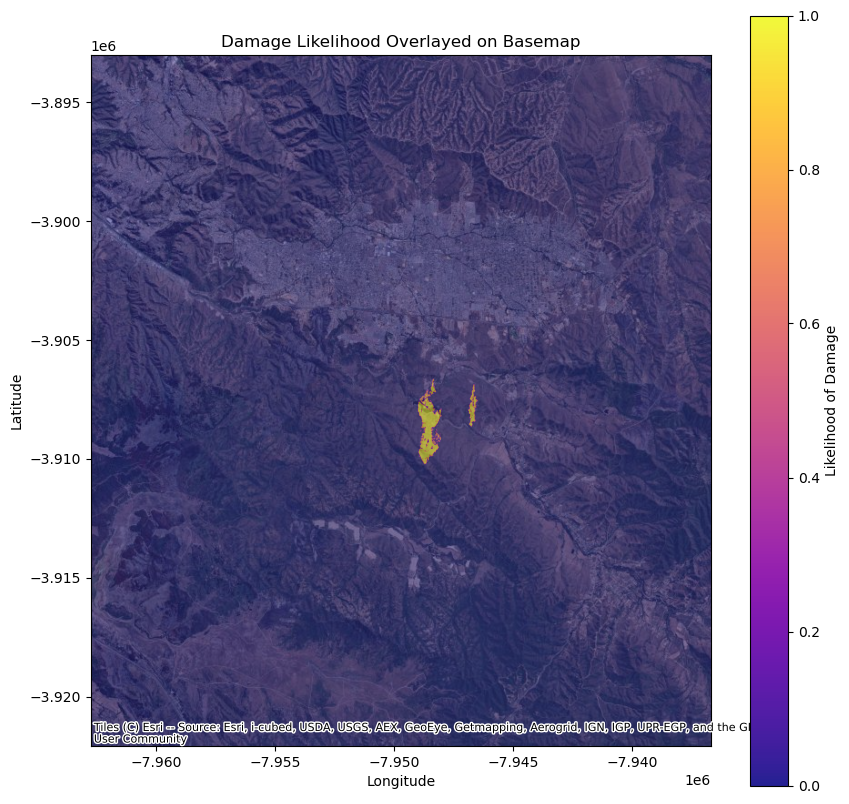

In [267]:
import contextily as ctx

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image, extent=extent_wm, cmap='plasma', alpha=0.9, origin='upper')

# Add the basemap
ctx.add_basemap(ax, crs="EPSG:3857", source=ctx.providers.Esri.WorldImagery, alpha=.5)

# Add labels and title
plt.colorbar(ax.images[0], ax=ax, label='Likelihood of Damage')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Damage Likelihood Overlayed on Basemap')
plt.show()